In [1]:
### Data Analaysis
import numpy as np
import pandas as pd

### Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px

from plotly.subplots import make_subplots
from scipy.interpolate import make_interp_spline, BSpline

%matplotlib inline

In [37]:
import warnings
warnings.simplefilter(action='ignore', category=Warning)

pd.set_option('display.max_columns', None)
pd.options.plotting.backend = "plotly"

confirmed_cases_df = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv") 
recovered_cases_df = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv")
death_cases_df = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv")

In [40]:
confirmed_country = confirmed_cases_df.groupby('Country/Region').sum().drop(['Lat','Long'],axis=1)
confirmed_country.head()


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,4,4,5,7,7,7,11,16,21,22,22,22,24,24,40,40,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142,22890,23546,24102,24766,25527,26310,26874,27532,27878,28424,28833,29157,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,10,12,23,33,38,42,51,55,59,64,70,76,89,104,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099,1122,1137,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341,1385,1416,1464,1521,1590,1672,1722,1788,1838,1891,1962,1995,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,3,5,12,12,17,17,19,20,20,20,24,26,37,48,54,60,74,87,90,139,201,230,264,302,367,409,454,511,584,716,847,986,1171,1251,1320,1423,1468,1572,1666,1761,1825,1914,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295,4474,4648,4838,4997,5182,5369,5558,5723,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697,8857,8997,9134,9267,9394,9513,9626,9733,9831,9935,10050,10154,10265,10382,10484,10589,10698,10810,10919,11031,11147,11268,11385,11504,11631,11771,11920,12076,12248,12445,12685,12968,13273,13571,13907,14272,14657,15070,15500,15941,16404
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,39,39,53,75,88,113,133,164,188,224,267,308,334,370,376,390,428,439,466,501,525,545,564,583,601,601,638,646,659,673,673,696,704,713,717,717,723,723,731,738,738,743,743,743,745,745,747,748,750,751,751,752,752,754,755,755,758,760,761,761,761,761,761,761,762,762,762,762,762,763,763,763,763,764,764,764,765,844,851,852,852,852,852,852,852,852,852,853,853,853,853,854,854,855,855,855,855,855,855,855,855,855,855,855,855,855

In [41]:
confirmed_country = confirmed_country.transpose()
confirmed_country.index

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '6/27/20', '6/28/20', '6/29/20', '6/30/20', '7/1/20', '7/2/20',
       '7/3/20', '7/4/20', '7/5/20', '7/6/20'],
      dtype='object', length=167)

In [42]:
confirmed_country.index.dtype

dtype('O')

In [43]:
# Set index as DateTimeIndex
datetime_index = pd.DatetimeIndex(confirmed_country.index)
confirmed_country.set_index(datetime_index, inplace=True)

# Check out index
confirmed_country.index

DatetimeIndex(['2020-01-22', '2020-01-23', '2020-01-24', '2020-01-25',
               '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29',
               '2020-01-30', '2020-01-31',
               ...
               '2020-06-27', '2020-06-28', '2020-06-29', '2020-06-30',
               '2020-07-01', '2020-07-02', '2020-07-03', '2020-07-04',
               '2020-07-05', '2020-07-06'],
              dtype='datetime64[ns]', length=167, freq=None)

In [44]:
countries = ['US','Brazil','Russia','India','United Kingdom','Spain','Italy','France','Iran','China']
confirmed_country[countries].plot(labels=dict(index="Date", value="Reported Confirmed cases count"), 
              title="Reported Confirmed Cases Time Series")

In [45]:
countries = ['US','Brazil','Russia','India','United Kingdom','Spain','Italy','France','Iran','China']
confirmed_country[countries].plot(labels=dict(index="Date", value="Reported Confirmed cases count"), 
              title="Reported Confirmed Cases Time Series", log_y=True)

In [46]:

#Latest date
confirmed_country_temp = confirmed_country.iloc[confirmed_country.shape[0]-1].to_frame()
confirmed_country_temp.columns = ['count']
confirmed_country_temp = confirmed_country_temp.reset_index()

In [47]:

fig = px.choropleth(confirmed_country_temp, 
                    locations="Country/Region", 
                    locationmode='country names', 
                    color="count", 
                    hover_name="Country/Region", 
                    range_color=[1,500000], 
                    color_continuous_scale="peach", 
                    title='Countries with Confirmed Cases')
fig.show()


In [48]:
europe = list(['Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland',
               'Italy', 'Latvia','Luxembourg','Lithuania','Malta','Norway','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia',
               'Spain', 'Sweden', 'United Kingdom', 'Iceland', 'Russia', 'Switzerland', 'Serbia', 'Ukraine', 'Belarus',
               'Albania', 'Bosnia and Herzegovina', 'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia'])
europe_confirmed_country_temp = confirmed_country_temp[confirmed_country_temp["Country/Region"].isin(europe)]
europe_confirmed_country_temp.head()

,Country/Region,count
1,Albania,2964
9,Austria,18365
15,Belarus,63804
16,Belgium,62058
21,Bosnia and Herzegovina,5458


In [49]:
fig = px.choropleth(europe_confirmed_country_temp, 
                    locations="Country/Region", 
                    locationmode='country names', 
                    color="count", 
                    hover_name="Country/Region", range_color=[1,200000], 
                    color_continuous_scale='portland', 
                    title='European Countries with Confirmed Cases', 
                    scope='europe', height=800)
fig.show()

In [50]:
confirmed_country_time = confirmed_country.unstack()
confirmed_country_time = confirmed_country_time.reset_index()
confirmed_country_time.columns = ["country","date","confirmed"]
confirmed_country_time['date'] = pd.to_datetime(confirmed_country_time['date'])
confirmed_country_time['date'] = confirmed_country_time['date'].dt.strftime('%m/%d/%Y')
confirmed_country_time.head()


,country,date,confirmed
0,Afghanistan,01/22/2020,0
1,Afghanistan,01/23/2020,0
2,Afghanistan,01/24/2020,0
3,Afghanistan,01/25/2020,0
4,Afghanistan,01/26/2020,0


In [51]:
fig = px.scatter_geo(confirmed_country_time, locations="country", 
                     locationmode='country names', 
                     color="confirmed", size='confirmed', 
                     hover_name="country", 
                     range_color= [0, 100000], 
                     projection="natural earth", 
                     animation_frame="date", 
                     title='COVID-19: Confirmed cases Spread Over Time', 
                     color_continuous_scale="portland")
fig.show()

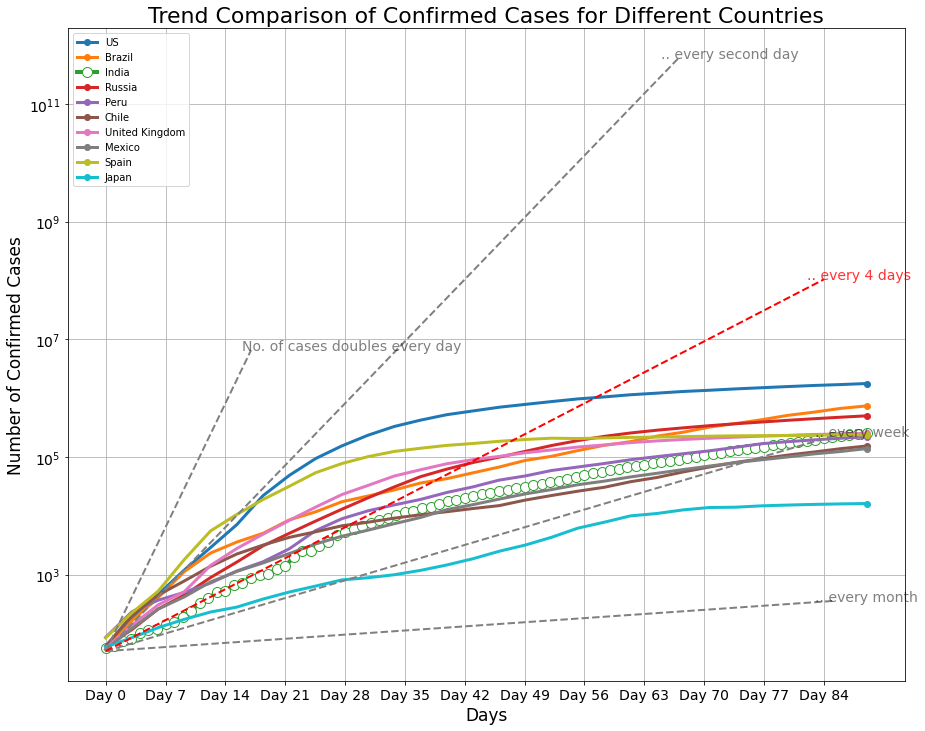

In [52]:

temp = confirmed_cases_df.groupby('Country/Region').sum().drop(["Lat","Long"],axis =1) \
                        .sort_values(confirmed_cases_df.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 9:
        if country != "India" and country != "Japan" :
            continue
    days = 90
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    if country != "India":
        plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
    else:
        marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
        plt.plot(date,t,"-.",label = country,**marker_style)

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-22))
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# India is following trend similar to doulbe the cases in 4 days but it may increase the rate 
x = np.arange(0,int(days-5))
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="Red",xycoords="data",fontsize=14,alpha = 0.8)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Confirmed Cases for Different Countries",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig('Trend Comparison with India (confirmed).png')
plt.show()

In [53]:
deaths_country = death_cases_df.groupby('Country/Region').sum().drop(['Lat','Long'],axis=1)
deaths_country = deaths_country.transpose()

# Set index as DateTimeIndex
datetime_index = pd.DatetimeIndex(deaths_country.index)
deaths_country.set_index(datetime_index, inplace=True)

deaths_country.head()

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burma,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Cote d'Ivoire,Croatia,Cuba,Cyprus,Czechia,Denmark,Diamond Princess,Djibouti,Dominica,Dominican Republic,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Eswatini,Ethiopia,Fiji,Finland,France,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Holy See,Honduras,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,"Korea, South",Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Liechtenstein,Lithuania,Luxembourg,MS Zaandam,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Monaco,Mongolia,Montenegro,Morocco,Mozambique,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Macedonia,Norway,Oman,Pakistan,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Qatar,Romania,Russia,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,San Marino,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Syria,Taiwan*,Tajikistan,Tanzania,Thailand,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,US,Uganda,Ukraine,United Arab Emirates,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [54]:
countries = ['US','Brazil','Russia','India','United Kingdom','Spain','Italy','France','Iran','China']
deaths_country[countries].plot(labels=dict(index="Date", value="Reported Death cases count"), 
              title="Reported Death Cases Time Series")

In [55]:
countries = ['US','Brazil','Russia','India','United Kingdom','Spain','Italy','France','Iran','China']
deaths_country[countries].plot(labels=dict(index="Date", value="Reported Death cases count"), 
              title="Reported Death Cases Time Series", log_y=True)

In [56]:
deaths_country_time = deaths_country.unstack()
deaths_country_time = deaths_country_time.reset_index()
deaths_country_time.columns = ["country","date","death"]
deaths_country_time['date'] = pd.to_datetime(deaths_country_time['date'])
deaths_country_time['date'] = deaths_country_time['date'].dt.strftime('%m/%d/%Y')
deaths_country_time.head()

,country,date,death
0,Afghanistan,01/22/2020,0
1,Afghanistan,01/23/2020,0
2,Afghanistan,01/24/2020,0
3,Afghanistan,01/25/2020,0
4,Afghanistan,01/26/2020,0


In [57]:
fig = px.scatter_geo(deaths_country_time, locations="country", 
                     locationmode='country names', 
                     color="death", size='death', 
                     hover_name="country", 
                     range_color= [0, 10000], 
                     projection="natural earth", 
                     animation_frame="date", 
                     title='COVID-19: Death Cases Spread Over Time', 
                     color_continuous_scale="portland")
fig.show()


In [58]:
recovered_country = recovered_cases_df.groupby('Country/Region').sum().drop(['Lat','Long'],axis=1)
recovered_country = recovered_country.transpose()

# Set index as DateTimeIndex
datetime_index = pd.DatetimeIndex(recovered_country.index)
recovered_country.set_index(datetime_index, inplace=True)

recovered_country.head()

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burma,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Cote d'Ivoire,Croatia,Cuba,Cyprus,Czechia,Denmark,Diamond Princess,Djibouti,Dominica,Dominican Republic,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Eswatini,Ethiopia,Fiji,Finland,France,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Holy See,Honduras,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,"Korea, South",Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Liechtenstein,Lithuania,Luxembourg,MS Zaandam,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Monaco,Mongolia,Montenegro,Morocco,Mozambique,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Macedonia,Norway,Oman,Pakistan,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Qatar,Romania,Russia,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,San Marino,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Syria,Taiwan*,Tajikistan,Tanzania,Thailand,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,US,Uganda,Ukraine,United Arab Emirates,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,36,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,49,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [59]:
countries = ['US','Brazil','Russia','India','United Kingdom','Spain','Italy','France','Iran','China']
recovered_country[countries].plot(labels=dict(index="Date", value="Recovered cases count"), 
              title="Recovered Cases Time Series")

In [60]:
countries = ['US','Brazil','Russia','India','United Kingdom','Spain','Italy','France','Iran','China']
recovered_country[countries].plot(labels=dict(index="Date", value="Recovered cases count"), 
              title="Recovered Cases Time Series", log_y=True)


In [61]:
recovered_country_time = recovered_country.unstack()
recovered_country_time = recovered_country_time.reset_index()
recovered_country_time.columns = ["country","date","recovered"]
recovered_country_time['date'] = pd.to_datetime(recovered_country_time['date'])
recovered_country_time['date'] = recovered_country_time['date'].dt.strftime('%m/%d/%Y')
recovered_country_time.head()

,country,date,recovered
0,Afghanistan,01/22/2020,0
1,Afghanistan,01/23/2020,0
2,Afghanistan,01/24/2020,0
3,Afghanistan,01/25/2020,0
4,Afghanistan,01/26/2020,0


In [62]:
fig = px.scatter_geo(recovered_country_time, locations="country", 
                     locationmode='country names', 
                     color="recovered", size='recovered', 
                     hover_name="country", 
                     range_color= [0, 10000], 
                     projection="natural earth", 
                     animation_frame="date", 
                     title='COVID-19: Recoveries Spread Over Time', 
                     color_continuous_scale="portland")
fig.show()

In [63]:
def remove_dup_columns(frame):
     keep_names = set()
     keep_icols = list()
     for icol, name in enumerate(frame.columns):
          if name not in keep_names:
               keep_names.add(name)
               keep_icols.append(icol)
     return frame.iloc[:, keep_icols]

combined_country = pd.concat([confirmed_country_time, deaths_country_time, recovered_country_time],axis=1)[['country','date','confirmed','death','recovered']]
combined_country = remove_dup_columns(combined_country)

combined_country['active'] = combined_country['confirmed'] - combined_country['death'] -  combined_country['recovered']
combined_country['mortality_rate'] = np.round((combined_country['death']/combined_country['confirmed'])*100,2)
combined_country.tail()

,country,date,confirmed,death,recovered,active,mortality_rate
31391,Zimbabwe,07/02/2020,617,7,173,437,1.13
31392,Zimbabwe,07/03/2020,625,7,176,442,1.12
31393,Zimbabwe,07/04/2020,698,8,181,509,1.15
31394,Zimbabwe,07/05/2020,716,8,181,527,1.12
31395,Zimbabwe,07/06/2020,734,9,197,528,1.23


In [64]:
x = combined_country['date']
y = combined_country['confirmed']
z = combined_country['death']
w = combined_country['recovered']
a = combined_country['active']

#call Bar charts and assign to fig_t. Add traces to the same figure
fig_t = go.Figure(go.Bar(x=x, y=y, name='Total Confirmed', marker_color='indianred', opacity=.7))
fig_t.add_trace(go.Bar(x=x, y=a, name='Total Active', marker_color='mediumblue', opacity=0.7))
fig_t.add_trace(go.Bar(x=x, y=w, name='Total recovered', marker_color='lightseagreen', opacity=0.7))
fig_t.add_trace(go.Bar(x=x, y=z, name='Total deaths', marker_color='gray', opacity=1))

#here we define layout of the chart
fig_t.update_layout(barmode='overlay', 
                    xaxis={'categoryorder':'total ascending'},
                    xaxis_type='category',
                    title={
        'text': 'Cummulative COVID-19 Trend',
        'y':0.79,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},)
fig_t.update_xaxes(title= '----->Timeline' ,showline=True)
fig_t.update_yaxes(title= '----->Number of cases', showline=True)
fig_t.show()

In [65]:
x = combined_country['date']
m = combined_country['mortality_rate']
fig_t = go.Figure(go.Bar(x=x, y=m, name='Mortality Rate', marker_color='indianred', opacity=.7))

#here we define layout of the chart
fig_t.update_layout(barmode='overlay', 
                    xaxis={'categoryorder':'total ascending'},
                    xaxis_type='category',
                    title={
        'text': 'Cummulative Mortality Rate Trend',
        'y':0.79,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},)
fig_t.update_xaxes(title= '----->Timeline' ,showline=True)
fig_t.update_yaxes(title= '----->Mortality Rate', showline=True)
fig_t.show()

In [66]:
india_data = combined_country[combined_country["country"]=='India']


In [67]:
x = india_data['date']
y = india_data['confirmed']
z = india_data['death']
w = india_data['recovered']
a = india_data['active']

#call Bar charts and assign to fig_t. Add traces to the same figure
fig_t = go.Figure(go.Bar(x=x, y=y, name='Total Confirmed', marker_color='indianred', opacity=.7))
fig_t.add_trace(go.Bar(x=x, y=a, name='Total Active', marker_color='mediumblue', opacity=0.7))
fig_t.add_trace(go.Bar(x=x, y=w, name='Total recovered', marker_color='lightseagreen', opacity=0.7))
fig_t.add_trace(go.Bar(x=x, y=z, name='Total deaths', marker_color='gray', opacity=1))

#here we define layout of the chart
fig_t.update_layout(barmode='overlay', 
                    xaxis={'categoryorder':'total ascending'},
                    xaxis_type='category',
                    title={
        'text': 'Cummulative COVID-19 Trend of India',
        'y':0.79,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},)
fig_t.update_xaxes(title= '----->Timeline' ,showline=True)
fig_t.update_yaxes(title= '----->Number of cases', showline=True)
fig_t.show()

In [68]:
confirmed_india = confirmed_country['India'].reset_index().rename(columns={'index':'ds','India':'y'})
confirmed_india['ds'] = pd.to_datetime(confirmed_india['ds'])
confirmed_india.head()

,ds,y
0,2020-01-22,0
1,2020-01-23,0
2,2020-01-24,0
3,2020-01-25,0
4,2020-01-26,0


In [9]:
from fbprophet import Prophet

ModuleNotFoundError: No module named 'fbprophet'